In [1]:
import pandas as pd
import pickle

from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn import metrics
import sklearn.neighbors
from sklearn.neighbors import kneighbors_graph

import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np

import seaborn as sns

In [2]:
pd.set_option('display.max_columns',None)

In [3]:
# 0.1 load data from file
from google.colab import files
import io

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving static_defenses.csv to static_defenses.csv
User uploaded file "static_defenses.csv" with length 5206629 bytes


In [4]:
static_defenses = pd.read_csv(io.StringIO(uploaded[fn].decode('utf-8')),index_col="id")
static_defenses.head()

,Unnamed: 0,defensivelinezonePlayers,deepzonePlayers,hookzonePlayers,curlzonePlayers,flatzonePlayers,defenseArea,defenseAreaCoverDefenders,width,height,numberQBs,numberWRs,numberTEs,numberRBs,numberFBs,numberOffensivePlayersAnotherPosition,numberSafeties,numberLBs,numberCBs,strongSide,numberPlayersDefenseStrongSide,numberPlayersDefenseWeakSide,numberPlayersOffenseStrongSide,numberPlayersOffenseWeakSide,differenceOffenseVsDefenseWidth,differenceOffenseVsDefenseStrongSide,differenceOffenseVsDefenseWeakSide,HeightByWeightDeep,HeightByWeightHook,HeightByWeightCurl,HeightByWeightFlat,WeightByArea,density,densityNoLine,densityInsidePoints,densityInsidePointsNoLine
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018090600:75:1,0,0,1,3,2,1,194.31095,194.31095,22.96,15.25,1,2,1,1,1,0,3,2,2,left,3,4,3,2,-0.63,0,-2,0.020227,0.018643,0.020066,0.021034,3.376032,0.036025,0.036025,6.974268,6.974268
2018090600:146:1,1,0,1,3,2,1,204.17725,204.17725,29.22,12.57,1,3,1,1,0,0,2,2,3,right,3,4,2,3,-1.15,-1,-1,0.020227,0.019228,0.020356,0.020455,3.178611,0.034284,0.034284,6.975511,6.975511
2018090600:168:1,2,0,1,2,2,2,277.65495,277.65495,33.67,15.21,1,2,1,2,0,0,2,2,3,left,5,2,4,1,0.71,-1,-1,0.020227,0.017683,0.020997,0.020745,2.337434,0.025211,0.025211,6.985594,6.985594
2018090600:190:1,3,1,0,2,3,1,189.16960,165.05520,26.42,12.91,1,3,1,1,0,0,3,1,3,right,2,5,2,3,-3.11,0,-2,0.000000,0.020120,0.021193,0.020455,3.192871,0.037004,0.036351,6.973569,6.969707
2018090600:320:1,5,1,0,3,3,1,187.12510,153.20020,27.80,13.29,1,3,1,1,0,0,2,3,3,left,3,5,3,2,-4.82,0,-3,0.000000,0.018995,0.019537,0.021279,4.281979,0.042752,0.045692,7.978624,7.980418


In [5]:
static_defenses.drop(["Unnamed: 0"],axis=1,inplace=True)

In [6]:
static_defenses.replace({"right":0,"left":1},inplace=True)

Normalización de los datos

In [7]:
scaler = preprocessing.StandardScaler()
static_defenses1 = scaler.fit_transform(static_defenses)

In [8]:
scaler = preprocessing.MinMaxScaler()
static_defenses2 = scaler.fit_transform(static_defenses)

In [9]:
scaler = preprocessing.RobustScaler()
static_defenses3 = scaler.fit_transform(static_defenses)

In [10]:
scaler = preprocessing.PowerTransformer()
static_defenses4 = scaler.fit_transform(static_defenses)

In [11]:
static_defenses.stack().max()

1462.3748

## Histogramas

Text(0.5, 1.0, 'Datos originales')

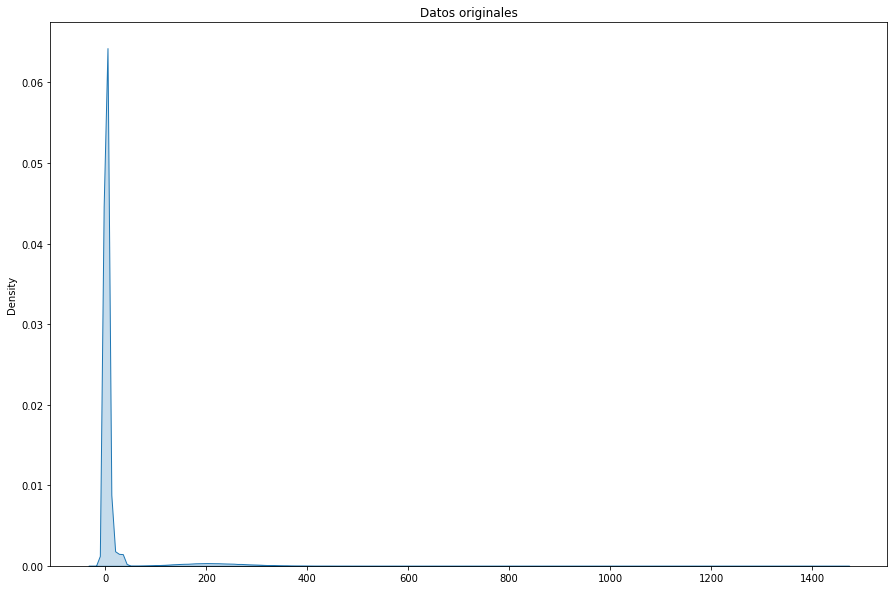

In [12]:
plt.figure(figsize = (15,10))
sns.kdeplot(data=static_defenses.stack(), shade=True).set_title('Datos originales')

In [13]:
standarscalerDF = pd.DataFrame(static_defenses1,columns=static_defenses.columns)

Text(0.5, 1.0, 'Datos normalizados con StandardScaler')

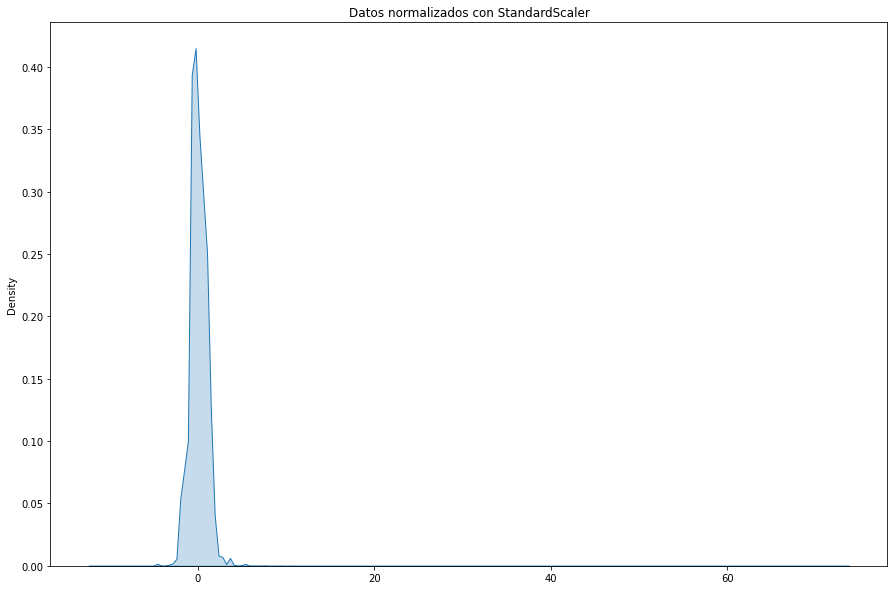

In [14]:
plt.figure(figsize = (15,10))
sns.kdeplot(data=standarscalerDF.stack(), shade=True).set_title('Datos normalizados con StandardScaler')

In [15]:
minmaxscalerDF = pd.DataFrame(static_defenses2,columns=static_defenses.columns)

Text(0.5, 1.0, 'Datos normalizados con MinMaxScaler')

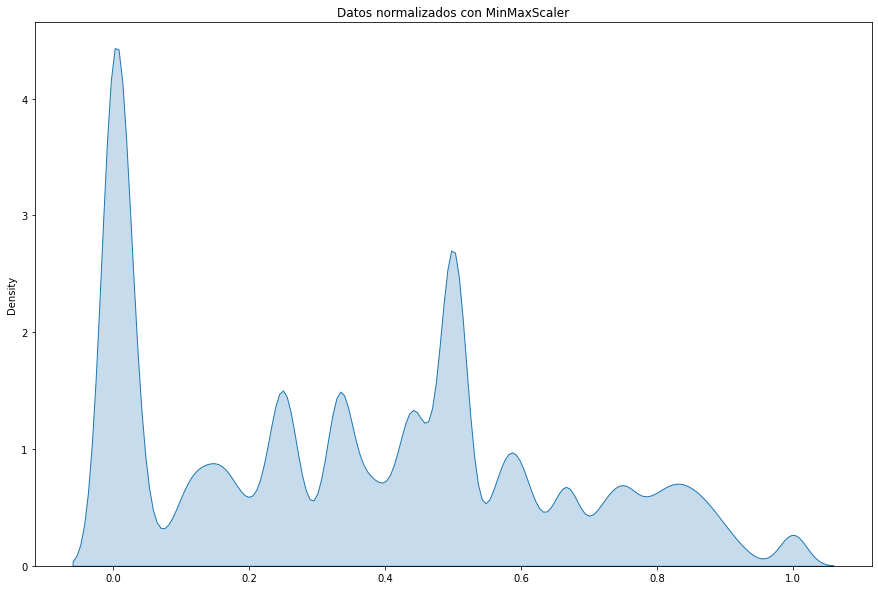

In [16]:
plt.figure(figsize = (15,10))
sns.kdeplot(data=minmaxscalerDF.stack(), shade=True).set_title('Datos normalizados con MinMaxScaler')

In [17]:
robustscalerDF = pd.DataFrame(static_defenses3,columns=static_defenses.columns)

Text(0.5, 1.0, 'Datos normalizados con RobustScaler')

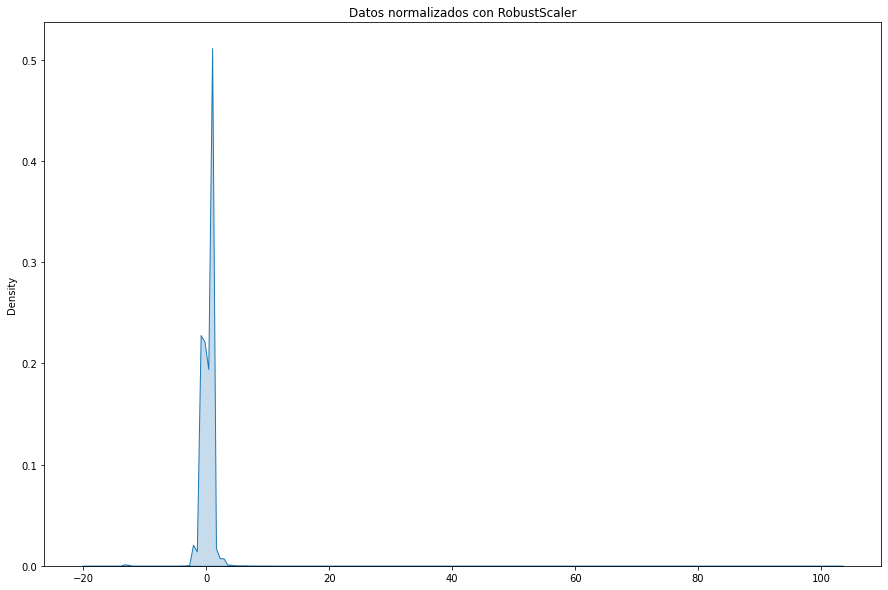

In [18]:
plt.figure(figsize = (15,10))
sns.kdeplot(data=robustscalerDF.stack(), shade=True).set_title('Datos normalizados con RobustScaler')

In [19]:
powertransformerDF = pd.DataFrame(static_defenses4,columns=static_defenses.columns)

Text(0.5, 1.0, 'Datos normalizados con PowerTransformer')

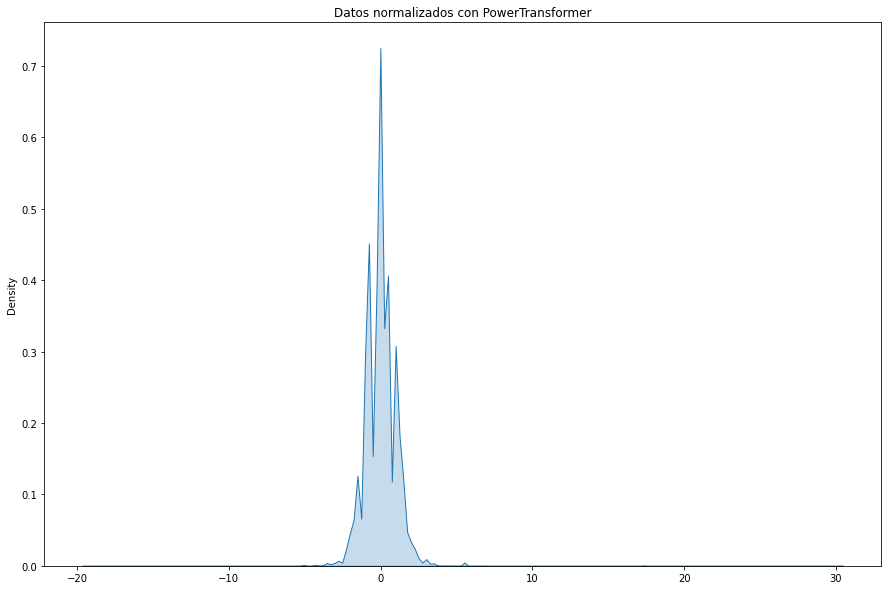

In [20]:
plt.figure(figsize = (15,10))
sns.kdeplot(data=powertransformerDF.stack(), shade=True).set_title('Datos normalizados con PowerTransformer')

# PCA

In [21]:
pca_ss = PCA ()
X_pca_ss = pca_ss.fit_transform(static_defenses1)
X_pca_ss.shape

(16498, 35)

In [22]:
pca_mms = PCA ()
X_pca_mms = pca_mms.fit_transform(static_defenses2)
X_pca_mms.shape

(16498, 35)

In [23]:
pca_rs = PCA ()
X_pca_rs = pca_rs.fit_transform(static_defenses3)
X_pca_rs.shape

(16498, 35)

In [24]:
pca_pt = PCA ()
X_pca_pt = pca_pt.fit_transform(static_defenses4)
X_pca_pt.shape

(16498, 35)

In [25]:
exp_var_cumul = np.cumsum(pca_ss.explained_variance_ratio_)

px.area(
    x=range(1, exp_var_cumul.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "# Components", "y": "Explained Variance"}
)

Para este 14 componentes

In [26]:
exp_var_cumul = np.cumsum(pca_mms.explained_variance_ratio_)

px.area(
    x=range(1, exp_var_cumul.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "# Components", "y": "Explained Variance"}
)

Para este 8 componentes

In [27]:
exp_var_cumul = np.cumsum(pca_rs.explained_variance_ratio_)

px.area(
    x=range(1, exp_var_cumul.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "Número de componentes", "y": "Variabilidad"}
)

Para este 5 componentes

In [28]:
exp_var_cumul = np.cumsum(pca_pt.explained_variance_ratio_)

px.area(
    x=range(1, exp_var_cumul.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "# Components", "y": "Explained Variance"}
)

Para este 13 componentes

De momento vamos a probar con el RobustScaler con 5 componentes

##Nuevos datasets

In [29]:
X_pca_ss = PCA(n_components = 14).fit_transform(static_defenses1)
X_pca_ss.shape

(16498, 14)

In [30]:
X_pca_mms = PCA(n_components = 8).fit_transform(static_defenses2)
X_pca_mms.shape

(16498, 8)

In [31]:
X_pca_rs = PCA(n_components = 5).fit_transform(static_defenses3)
X_pca_rs.shape

(16498, 5)

In [32]:
X_pca_pt = PCA(n_components = 13).fit_transform(static_defenses4)
X_pca_pt.shape

(16498, 13)

## Heat map

In [ ]:
df = pd.DataFrame(X_pca, columns = ['PC1','PC2','PC3','PC4','PC5','PC6'])

NameError: ignored

In [ ]:
def corr(df1, df2):
    n = len(df1)
    v1, v2 = df1.values, df2.values
    sums = np.multiply.outer(v2.sum(0), v1.sum(0))
    stds = np.multiply.outer(v2.std(0), v1.std(0))
    return pd.DataFrame((v2.T.dot(v1) - sums / n) / stds / n,
                        df2.columns, df1.columns)

In [ ]:
corr(df,static_defenses)

,PC1,PC2,PC3,PC4,PC5,PC6
defensivelinezonePlayers,-0.003517,0.237733,-0.509107,0.595699,-0.016641,-0.011757
deepzonePlayers,-0.130643,0.224286,-0.419776,-0.402529,-0.056328,-0.031032
hookzonePlayers,0.290230,-0.481486,0.198748,0.199807,0.088188,0.069675
curlzonePlayers,0.386045,0.147444,0.078609,0.120091,-0.088176,-0.088322
flatzonePlayers,-0.834035,0.028991,-0.107304,-0.098835,0.057384,0.075015
defenseArea,-0.501408,0.252442,-0.650776,-0.346785,-0.054989,-0.017899
defenseAreaCoverDefenders,-0.496595,0.235246,-0.554589,-0.481880,-0.036582,-0.024137
width,-0.744239,0.082192,-0.182367,-0.188731,0.032918,0.035545
height,-0.158549,0.229312,-0.662880,-0.379648,-0.091303,-0.023530
numberQBs,0.016895,-0.007544,0.035594,0.008572,-0.000669,0.002031


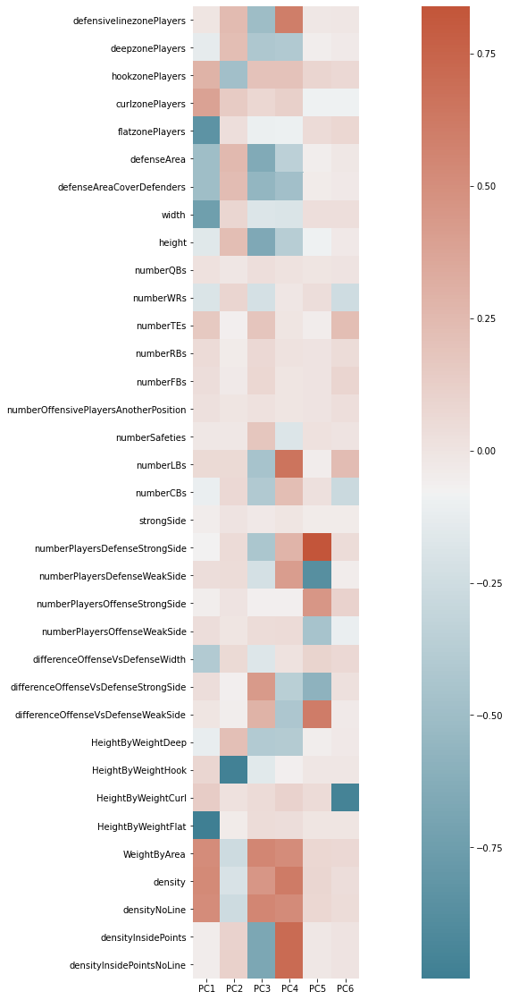

In [ ]:
#mtx_corr = static_defenses.corr()

cmap = sns.diverging_palette(220, 20, as_cmap=True)
plt.figure(figsize = (25,20))
sns.heatmap(corr(df,static_defenses),xticklabels=df.columns,yticklabels=static_defenses.columns,annot=False,square=True,cmap=cmap)

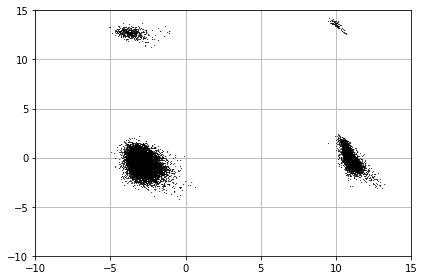

In [ ]:
import matplotlib.pyplot as plt
numbers = np.arange(len(X_pca))
fig, ax = plt.subplots()
for i in range(len(X_pca)):
    plt.text(X_pca[i][0], X_pca[i][1],'.',color="black") 
plt.xlim(-10, 15)
plt.ylim(-10, 15)
ax.grid(True)
fig.tight_layout()
plt.show()

# DBSCAN

In [ ]:
dist = sklearn.neighbors.DistanceMetric.get_metric('euclidean')

In [ ]:
minPts=10

##StandardScaler


In [ ]:
matsim = dist.pairwise(X_pca_ss)

In [ ]:
A = kneighbors_graph(X_pca_ss, minPts, include_self=False)
Ar = A.toarray()

seq = []
for i,s in enumerate(X_pca_ss):
    for j in range(len(X_pca_ss)):
        if Ar[i][j] != 0:
            seq.append(matsim[i][j])
            
seq.sort()

In [ ]:
fig = px.line(x=np.arange(0, len(seq), 1), y=seq)
fig.show()

In [ ]:
results = []
for eps in np.arange(3, 10, 0.5):
    db = DBSCAN(eps, min_samples=minPts).fit(X_pca_ss)
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_outliers = list(labels).count(-1)
    #print ("%6.2f, %d, %d" % (eps, n_clusters_, n_outliers))
    results.append([eps, n_clusters_, n_outliers])

#print results
from tabulate import tabulate
print(tabulate(results, headers = ("eps", "clusters", "outliers")))

  eps    clusters    outliers
-----  ----------  ----------
  3             4        1071
  3.5           3         532
  4             4         328
  4.5           3         206
  5             3         141
  5.5           4          82
  6             5          46
  6.5           4          24
  7             4          16
  7.5           4          14
  8             4          13
  8.5           3          10
  9             3           8
  9.5           3           8


##MinMaxScaler


In [ ]:
matsim = dist.pairwise(X_pca_mms)

In [ ]:
A = kneighbors_graph(X_pca_mms, minPts, include_self=False)
Ar = A.toarray()

seq = []
for i,s in enumerate(X_pca_mms):
    for j in range(len(X_pca_mms)):
        if Ar[i][j] != 0:
            seq.append(matsim[i][j])
            
seq.sort()

In [ ]:
fig = px.line(x=np.arange(0, len(seq), 1), y=seq)
fig.show()

In [ ]:
results = []
for eps in np.arange(0.1, 0.8, 0.1):
    db = DBSCAN(eps, min_samples=minPts).fit(X_pca_mms)
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_outliers = list(labels).count(-1)
    #print ("%6.2f, %d, %d" % (eps, n_clusters_, n_outliers))
    results.append([eps, n_clusters_, n_outliers])

#print results
from tabulate import tabulate
print(tabulate(results, headers = ("eps", "clusters", "outliers")))

  eps    clusters    outliers
-----  ----------  ----------
  0.1         121       10262
  0.2          55        2673
  0.3          32         628
  0.4          15         188
  0.5           9          24
  0.6           8           8
  0.7           6           2


##RobustScaler

In [ ]:
matsim = dist.pairwise(X_pca_rs)

In [ ]:
A = kneighbors_graph(X_pca_rs, minPts, include_self=False)
Ar = A.toarray()

seq = []
for i,s in enumerate(X_pca_rs):
    for j in range(len(X_pca_rs)):
        if Ar[i][j] != 0:
            seq.append(matsim[i][j])
            
seq.sort()

In [ ]:
fig = px.line(x=np.arange(0, len(seq), 1), y=seq)
fig.show()

In [ ]:
results = []
for eps in np.arange(1, 15, 1):
    db = DBSCAN(eps, min_samples=minPts).fit(X_pca_rs)
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_outliers = list(labels).count(-1)
    #print ("%6.2f, %d, %d" % (eps, n_clusters_, n_outliers))
    results.append([eps, n_clusters_, n_outliers])

#print results
from tabulate import tabulate
print(tabulate(results, headers = ("eps", "clusters", "outliers")))

  eps    clusters    outliers
-----  ----------  ----------
    1           8         712
    2           6         155
    3           5          83
    4           5          56
    5           6          35
    6           6          28
    7           6          23
    8           6          23
    9           6          21
   10           5          20
   11           4          13
   12           3          13
   13           2           7
   14           2           4


## PowerTransformer

In [ ]:
matsim = dist.pairwise(X_pca_pt)

In [ ]:
A = kneighbors_graph(X_pca_pt, minPts, include_self=False)
Ar = A.toarray()

seq = []
for i,s in enumerate(X_pca_pt):
    for j in range(len(X_pca_pt)):
        if Ar[i][j] != 0:
            seq.append(matsim[i][j])
            
seq.sort()

In [ ]:
fig = px.line(x=np.arange(0, len(seq), 1), y=seq)
fig.show()

In [ ]:
results = []
for eps in np.arange(2, 10, 1):
    db = DBSCAN(eps, min_samples=minPts).fit(X_pca_pt)
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_outliers = list(labels).count(-1)
    #print ("%6.2f, %d, %d" % (eps, n_clusters_, n_outliers))
    results.append([eps, n_clusters_, n_outliers])

#print results
from tabulate import tabulate
print(tabulate(results, headers = ("eps", "clusters", "outliers")))

  eps    clusters    outliers
-----  ----------  ----------
    2          35        6397
    3           5        1222
    4           3         241
    5           2          77
    6           3          11
    7           3           5
    8           3           4
    9           3           2


##Resultados


In [ ]:
db = DBSCAN(eps=5, min_samples=10).fit(X_pca_ss)
labels = db.labels_
labels

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
static_defenses['dbscan_group_ss_5'] = labels

In [ ]:
db = DBSCAN(eps=5.5, min_samples=10).fit(X_pca_ss)
labels = db.labels_
labels

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
static_defenses['dbscan_group_ss_5.5'] = labels

In [ ]:
db = DBSCAN(eps=6, min_samples=10).fit(X_pca_ss)
labels = db.labels_
labels

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
static_defenses['dbscan_group_ss_6'] = labels

In [ ]:
db = DBSCAN(eps=0.4, min_samples=10).fit(X_pca_mms)
labels = db.labels_
labels

array([0, 1, 2, ..., 2, 3, 3])

In [ ]:
static_defenses['dbscan_group_mms'] = labels

In [ ]:
db = DBSCAN(eps=3, min_samples=10).fit(X_pca_rs)
labels = db.labels_
labels

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
static_defenses['dbscan_group_rs_3'] = labels

In [ ]:
db = DBSCAN(eps=4, min_samples=10).fit(X_pca_rs)
labels = db.labels_
labels

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
static_defenses['dbscan_group_rs_4'] = labels

In [ ]:
db = DBSCAN(eps=4, min_samples=10).fit(X_pca_pt)
labels = db.labels_
labels

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
static_defenses['dbscan_group_pt_4'] = labels

In [ ]:
db = DBSCAN(eps=5, min_samples=10).fit(X_pca_pt)
labels = db.labels_
labels

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
static_defenses['dbscan_group_pt_5'] = labels

##Guardar outliers para comparar

In [ ]:
#save dataset
pickle_file = open('outliers_minpts10_ss_5.pickle','wb')
pickle.dump(static_defenses[static_defenses["dbscan_group_ss_5"]==-1].index,pickle_file)
pickle_file.close()

In [ ]:
#save dataset
pickle_file = open('outliers_minpts10_ss_5.5.pickle','wb')
pickle.dump(static_defenses[static_defenses["dbscan_group_ss_5.5"]==-1].index,pickle_file)
pickle_file.close()

In [ ]:
#save dataset
pickle_file = open('outliers_minpts25_ss_6.pickle','wb')
pickle.dump(static_defenses[static_defenses["dbscan_group_ss_6"]==-1].index,pickle_file)
pickle_file.close()

In [ ]:
#save dataset
pickle_file = open('outliers_minpts10_mms_0.4.pickle','wb')
pickle.dump(static_defenses[static_defenses["dbscan_group_mms"]==-1].index,pickle_file)
pickle_file.close()

In [ ]:
#save dataset
pickle_file = open('outliers_minpts10_rs_3.pickle','wb')
pickle.dump(static_defenses[static_defenses["dbscan_group_rs_3"]==-1].index,pickle_file)
pickle_file.close()

In [ ]:
#save dataset
pickle_file = open('outliers_minpts10_rs_4.pickle','wb')
pickle.dump(static_defenses[static_defenses["dbscan_group_rs_4"]==-1].index,pickle_file)
pickle_file.close()

In [ ]:
#save dataset
pickle_file = open('outliers_minpts10_pt_4.pickle','wb')
pickle.dump(static_defenses[static_defenses["dbscan_group_pt_4"]==-1].index,pickle_file)
pickle_file.close()

In [ ]:
#save dataset
pickle_file = open('outliers_minpts10_pt_5.pickle','wb')
pickle.dump(static_defenses[static_defenses["dbscan_group_pt_5"]==-1].index,pickle_file)
pickle_file.close()

# Kmeans

In [33]:
# parameters

# to run 10 times with different random centroids 
# to choose the final model as the one with the lowest SSE
iterations = 10

# maximum number of iterations for each single run
max_iter = 300 

# controls the tolerance with regard to the changes in the 
# within-cluster sum-squared-error to declare convergence

tol = 1e-04 

 # random seed
random_state = 0

##StandarScaler

In [34]:
distortions = []
silhouettes = []

for i in range(2, 11):
    km = KMeans(i, init="k-means++", n_init = iterations ,max_iter= max_iter, tol = tol,random_state = random_state)
    labels = km.fit_predict(X_pca_ss)
    distortions.append(km.inertia_)
    silhouettes.append(metrics.silhouette_score(X_pca_ss, labels))

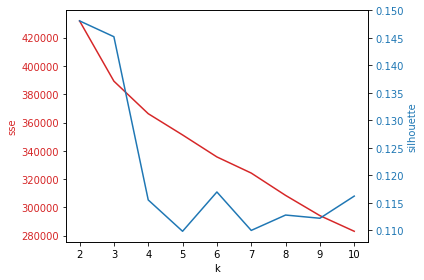

In [35]:
x = [i for i in range(2,11)]
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('k')
ax1.set_ylabel('sse', color=color)
ax1.plot(x, distortions, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('silhouette', color=color)  # we already handled the x-label with ax1
ax2.plot(x, silhouettes, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [36]:
k = 3

In [37]:
print ("Número de clusters", k)
km_ss = KMeans(k, init="k-means++", n_init = iterations ,
            max_iter= max_iter, tol = tol, random_state = random_state)

y_km_ss = km_ss.fit_predict(X_pca_ss)

Número de clusters 3


In [38]:
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X_pca_ss, y_km_ss))
      
print('Distortion: %.2f' % km_ss.inertia_)

Silhouette Coefficient: 0.145
Distortion: 389259.96


##MinMaxScaler

In [41]:
distortions = []
silhouettes = []

for i in range(2, 11):
    km = KMeans(i, init="k-means++", n_init = iterations ,max_iter= max_iter, tol = tol,random_state = random_state)
    labels = km.fit_predict(X_pca_mms)
    distortions.append(km.inertia_)
    silhouettes.append(metrics.silhouette_score(X_pca_mms, labels))

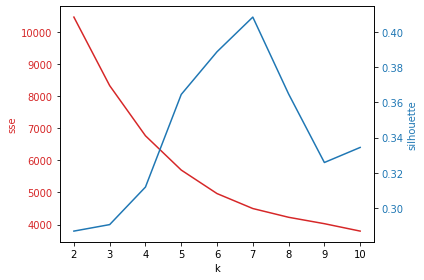

In [42]:
x = [i for i in range(2,11)]
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('k')
ax1.set_ylabel('sse', color=color)
ax1.plot(x, distortions, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('silhouette', color=color)  # we already handled the x-label with ax1
ax2.plot(x, silhouettes, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [43]:
k = 7

In [44]:
print ("Número de clusters", k)
km_mms = KMeans(k, init="k-means++", n_init = iterations ,
            max_iter= max_iter, tol = tol, random_state = random_state)

y_km_ss = km_mms.fit_predict(X_pca_mms)

Número de clusters 7


In [45]:
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X_pca_mms, y_km_ss))
      
print('Distortion: %.2f' % km_mms.inertia_)

Silhouette Coefficient: 0.409
Distortion: 4498.31


##RobustScaler

In [46]:
distortions = []
silhouettes = []

for i in range(2, 11):
    km = KMeans(i, init="k-means++", n_init = iterations ,max_iter= max_iter, tol = tol,random_state = random_state)
    labels = km.fit_predict(X_pca_rs)
    distortions.append(km.inertia_)
    silhouettes.append(metrics.silhouette_score(X_pca_rs, labels))

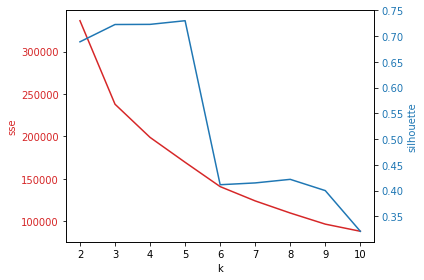

In [47]:
x = [i for i in range(2,11)]
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('k')
ax1.set_ylabel('sse', color=color)
ax1.plot(x, distortions, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('silhouette', color=color)  # we already handled the x-label with ax1
ax2.plot(x, silhouettes, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [48]:
k = 5

In [49]:
print ("Número de clusters", k)
km_rs = KMeans(k, init="k-means++", n_init = iterations ,
            max_iter= max_iter, tol = tol, random_state = random_state)

y_km_rs = km_rs.fit_predict(X_pca_rs)

Número de clusters 5


In [50]:
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X_pca_rs, y_km_rs))
      
print('Distortion: %.2f' % km_rs.inertia_)

Silhouette Coefficient: 0.730
Distortion: 169398.71


##PowerTransformer

In [51]:
distortions = []
silhouettes = []

for i in range(2, 11):
    km = KMeans(i, init="k-means++", n_init = iterations ,max_iter= max_iter, tol = tol,random_state = random_state)
    labels = km.fit_predict(X_pca_pt)
    distortions.append(km.inertia_)
    silhouettes.append(metrics.silhouette_score(X_pca_pt, labels))

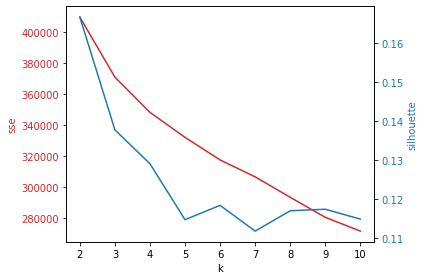

In [52]:
x = [i for i in range(2,11)]
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('k')
ax1.set_ylabel('sse', color=color)
ax1.plot(x, distortions, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('silhouette', color=color)  # we already handled the x-label with ax1
ax2.plot(x, silhouettes, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [53]:
k = 3

In [54]:
print ("Número de clusters", k)
km_pt = KMeans(k, init="k-means++", n_init = iterations ,
            max_iter= max_iter, tol = tol, random_state = random_state)

y_km_pt = km_pt.fit_predict(X_pca_pt)

Número de clusters 3


In [56]:
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X_pca_pt, y_km_pt))
      
print('Distortion: %.2f' % km_pt.inertia_)

Silhouette Coefficient: 0.138
Distortion: 370960.66


##Resultados

In [ ]:
km_ss.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [59]:
km_mms.labels_

array([5, 2, 5, ..., 5, 3, 3], dtype=int32)

In [60]:
km_rs.labels_

array([1, 1, 1, ..., 1, 1, 1], dtype=int32)

In [70]:
km_rs.labels_

array([1, 1, 1, ..., 1, 1, 1], dtype=int32)

In [61]:
km_pt.labels_

array([1, 1, 1, ..., 1, 1, 1], dtype=int32)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 



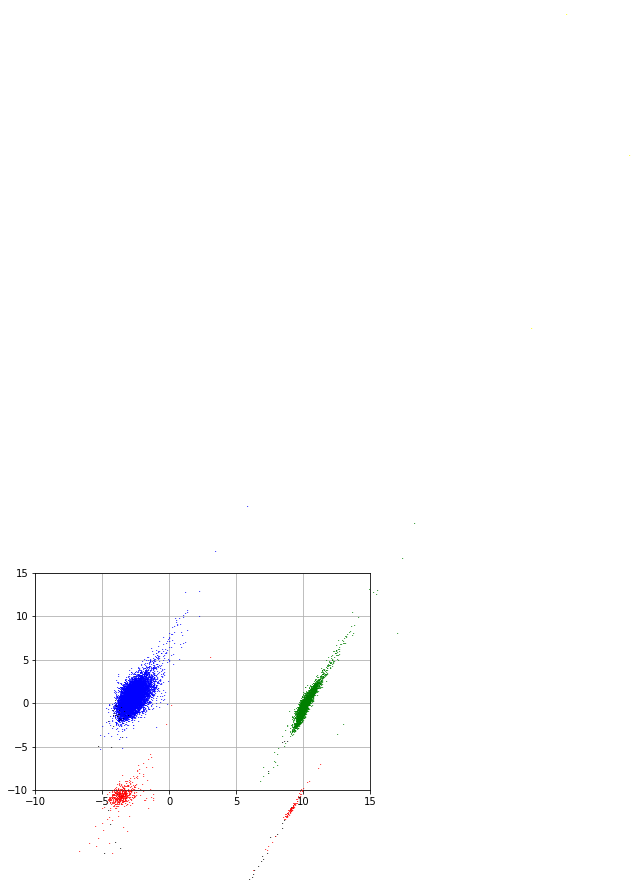

In [58]:
import matplotlib.pyplot as plt
colors = ["red","blue","yellow","green","black"]
numbers = np.arange(len(X_pca_rs))
fig, ax = plt.subplots()
for i in range(len(X_pca_rs)):
    plt.text(X_pca_rs[i][0], X_pca_rs[i][1],'.',color=colors[km_rs.labels_[i]]) 
plt.xlim(-10, 15)
plt.ylim(-10, 15)
ax.grid(True)
fig.tight_layout()
plt.show()

In [71]:
static_defenses['kmeans_group_ss'] = km_ss.labels_

In [72]:
static_defenses['kmeans_group_mms'] = km_mms.labels_

In [73]:
static_defenses['kmeans_group_rs'] = km_rs.labels_

In [74]:
static_defenses['kmeans_group_pt'] = km_pt.labels_

Explorar un poco los datos

In [75]:
res = static_defenses.groupby("kmeans_group_ss").describe()
res

defensivelinezonePlayers                                     \
                                   count      mean       std  min  25%  50%   
kmeans_group_ss                                                               
0                                 3656.0  2.326586  0.938616  0.0  2.0  2.0   
1                                 7621.0  0.555964  0.710752  0.0  0.0  0.0   
2                                 5221.0  0.648918  0.787774  0.0  0.0  0.0   

                          deepzonePlayers                                     \
                 75%  max           count      mean       std  min  25%  50%   
kmeans_group_ss                                                                
0                3.0  7.0          3656.0  0.512309  0.687080  0.0  0.0  0.0   
1                1.0  5.0          7621.0  0.718672  0.784431  0.0  0.0  1.0   
2                1.0  6.0          5221.0  0.232906  0.449944  0.0  0.0  0.0   

                          hookzonePlayers                                     \
                 75%  max           count      mean       std  min  25%  50%   
kmeans_group_ss                                                                
0                1.0  9.0          3656.0  1.830963  0.972893  0.0  1.0  2.0   
1                1.0  8.0          7621.0  1.703320  0.834792  0.0  1.0  2.0   
2                0.0  6.0          5221.0  2.606780  0.970219  0.0  2.0  3.0   

                          curlzonePlayers                                     \
                 75%  max           count      mean       std  min  25%  50%   
kmeans_group_ss                                                                
0                2.0  6.0          3656.0  3.068654  1.062965  0.0  2.0  3.0   
1                2.0  5.0          7621.0  2.679307  0.989328  0.0  2.0  3.0   
2                3.0  6.0          5221.0  3.385941  1.033290  0.0  3.0  3.0   

                          flatzonePlayers                                     \
                 75%  max           count      mean       std  min  25%  50%   
kmeans_group_ss                                                                
0                4.0  8.0          3656.0  1.308260  0.716350  0.0  1.0  1.0   
1                3.0  6.0          7621.0  1.658969  0.514700  0.0  1.0  2.0   
2                4.0  8.0          5221.0  0.464662  0.559955  0.0  0.0  0.0   

                          defenseArea                                    \
                 75%  max       count        mean        std        min   
kmeans_group_ss                                                           
0                2.0  3.0      3656.0  255.901364  77.703458   53.86995   
1                2.0  4.0      7621.0  263.531850  81.881878  110.80100   
2                1.0  2.0      5221.0  158.168005  40.029501    6.50975   

                                                                 \
                        25%         50%         75%         max   
kmeans_group_ss                                                   
0                209.084763  246.243575  292.137875  1311.46645   
1                219.001000  251.648250  291.870400  1462.37480   
2                133.288050  159.938650  185.362200   292.40060   

                defenseAreaCoverDefenders                                   \
                                    count        mean        std       min   
kmeans_group_ss                                                              
0                                  3656.0  220.471670  73.055412  28.23520   
1                                  7621.0  251.115284  79.245950  50.22165   
2                                  5221.0  145.416427  41.608781   2.47445   

                                                                 width  \
                        25%        50%         75%         max   count   
kmeans_group_ss                                                          
0                174.699412  211.54645  257.838825  1102.78570  3656.0  

In [76]:
res = static_defenses.groupby("kmeans_group_mms").describe()
res

defensivelinezonePlayers                                     \
                                    count      mean       std  min  25%  50%   
kmeans_group_mms                                                               
0                                  2622.0  0.993898  1.129180  0.0  0.0  1.0   
1                                  1525.0  0.980328  1.050375  0.0  0.0  1.0   
2                                  3718.0  0.930339  1.010166  0.0  0.0  1.0   
3                                  4262.0  0.965978  1.083259  0.0  0.0  1.0   
4                                   886.0  0.940181  1.037070  0.0  0.0  1.0   
5                                  2291.0  1.041030  1.074952  0.0  0.0  1.0   
6                                  1194.0  1.035176  1.099616  0.0  0.0  1.0   

                           deepzonePlayers                                     \
                  75%  max           count      mean       std  min  25%  50%   
kmeans_group_mms                                                                
0                 2.0  7.0          2622.0  0.000000  0.000000  0.0  0.0  0.0   
1                 2.0  6.0          1525.0  0.000000  0.000000  0.0  0.0  0.0   
2                 2.0  7.0          3718.0  1.145777  0.446488  1.0  1.0  1.0   
3                 2.0  6.0          4262.0  0.000000  0.000000  0.0  0.0  0.0   
4                 1.0  6.0           886.0  1.227991  0.983448  1.0  1.0  1.0   
5                 2.0  6.0          2291.0  1.172850  0.559769  1.0  1.0  1.0   
6                 2.0  6.0          1194.0  0.444724  0.782698  0.0  0.0  0.0   

                           hookzonePlayers                                     \
                  75%  max           count      mean       std  min  25%  50%   
kmeans_group_mms                                                                
0                 0.0  0.0          2622.0  2.102975  0.953757  0.0  1.0  2.0   
1                 0.0  0.0          1525.0  2.807213  1.035245  0.0  2.0  3.0   
2                 1.0  6.0          3718.0  1.587144  0.777901  0.0  1.0  2.0   
3                 0.0  0.0          4262.0  2.195917  0.973168  0.0  2.0  2.0   
4                 1.0  9.0           886.0  1.942438  0.931595  0.0  1.0  2.0   
5                 1.0  8.0          2291.0  1.549105  0.770421  0.0  1.0  2.0   
6                 1.0  7.0          1194.0  2.479062  1.079403  0.0  2.0  2.0   

                           curlzonePlayers                                     \
                  75%  max           count      mean       std  min  25%  50%   
kmeans_group_mms                                                                
0                 3.0  5.0          2622.0  3.101831  1.003582  0.0  2.0  3.0   
1                 3.0  6.0          1525.0  3.854426  1.005785  1.0  3.0  4.0   
2                 2.0  5.0          3718.0  2.477138  0.863506  0.0  2.0  2.0   
3                 3.0  6.0          4262.0  3.046692  0.985188  0.0  2.0  3.0   
4                 3.0  6.0           886.0  3.489842  1.002488  0.0  3.0  4.0   
5                 2.0  4.0          2291.0  2.421213  0.881278  0.0  2.0  2.0   
6                 3.0  6.0          1194.0  3.744556  0.992465  0.0  3.0  4.0   

                           flatzonePlayers                                     \
                  75%  max           count      mean       std  min  25%  50%   
kmeans_group_mms                                                                
0                 4.0  6.0          2622.0  1.505339  0.506134  1.0  1.0  2.0   
1                 4.0  8.0          1525.0  0.000000  0.000000  0.0  0.0  0.0   
2                 3.0  5.0          3718.0  1.578537  0.506234  1.0  1.0  2.0   
3                 4.0  7.0          4262.0  1.500704  0.503333  1.0  1.0  1.0   
4                 4.0  6.0           886.0  0.000000  0.000000  0.0  0.0  0.0   
5                 3.0  5.0          2291.0  1.588826  0.511302  0.0  1.0  2.0   
6                 4.0  7.0          1194.0  0.000000  

In [77]:
res = static_defenses.groupby("kmeans_group_rs").describe()
res

defensivelinezonePlayers                                     \
                                   count      mean       std  min  25%  50%   
kmeans_group_rs                                                               
0                                  639.0  2.267606  1.381267  0.0  1.0  2.0   
1                                12288.0  0.918132  1.021047  0.0  0.0  1.0   
2                                    3.0  3.333333  1.527525  2.0  2.5  3.0   
3                                 3482.0  0.948593  1.020305  0.0  0.0  1.0   
4                                   86.0  1.011628  1.079152  0.0  0.0  1.0   

                           deepzonePlayers                                     \
                  75%  max           count      mean       std  min  25%  50%   
kmeans_group_rs                                                                 
0                3.00  7.0           639.0  0.928013  1.111840  0.0  0.0  1.0   
1                2.00  7.0         12288.0  0.516602  0.620491  0.0  0.0  0.0   
2                4.00  5.0             3.0  0.000000  0.000000  0.0  0.0  0.0   
3                2.00  6.0          3482.0  0.398334  0.628379  0.0  0.0  0.0   
4                1.75  5.0            86.0  2.767442  2.901012  0.0  1.0  1.0   

                          hookzonePlayers                                      \
                 75%  max           count      mean       std  min   25%  50%   
kmeans_group_rs                                                                 
0                1.0  8.0           639.0  0.000000  0.000000  0.0  0.00  0.0   
1                1.0  5.0         12288.0  1.964355  0.853870  0.0  1.00  2.0   
2                0.0  0.0             3.0  1.666667  1.154701  1.0  1.00  1.0   
3                1.0  6.0          3482.0  2.569213  0.995800  0.0  2.00  3.0   
4                6.0  9.0            86.0  2.279070  1.753324  0.0  0.25  3.0   

                          curlzonePlayers                                     \
                 75%  max           count      mean       std  min  25%  50%   
kmeans_group_rs                                                                
0                0.0  0.0           639.0  3.466354  1.261329  1.0  3.0  3.0   
1                2.0  6.0         12288.0  2.777913  0.955974  0.0  2.0  3.0   
2                2.0  3.0             3.0  2.000000  1.000000  1.0  1.5  2.0   
3                3.0  6.0          3482.0  3.721999  0.952309  1.0  3.0  4.0   
4                4.0  6.0            86.0  0.000000  0.000000  0.0  0.0  0.0   

                          flatzonePlayers                                      \
                 75%  max           count      mean       std  min   25%  50%   
kmeans_group_rs                                                                 
0                4.0  8.0           639.0  1.353678  0.755408  0.0  1.00  2.0   
1                3.0  6.0         12288.0  1.534993  0.506084  1.0  1.00  2.0   
2                2.5  3.0             3.0  0.666667  1.154701  0.0  0.00  0.0   
3                4.0  7.0          3482.0  0.000000  0.000000  0.0  0.00  0.0   
4                0.0  0.0            86.0  1.430233  0.939846  0.0  0.25  2.0   

                          defenseArea                                    \
                 75%  max       count        mean         std       min   
kmeans_group_rs                                                           
0                2.0  3.0       639.0  286.824053  148.937442  19.00635   
1                2.0  4.0     12288.0  242.054315   70.657476  20.53200   
2                1.0  2.0         3.0   35.900233   31.894208   6.50975   
3                0.0  0.0      3482.0  166.140188   67.692727  12.29235   
4                2.0  4.0        86.0  389.476142  300.709562  75.57030   

                                                                 \
                        25%         50%         75%         max   
kmeans_group_rs                                             

Este era el que mejor resultado daba en silhouette pero no tiene grupos muy homogeneos.

In [78]:
res = static_defenses.groupby("kmeans_group_pt").describe()
res["deepzonePlayers"]

defensivelinezonePlayers                                     \
                                   count      mean       std  min  25%  50%   
kmeans_group_pt                                                               
0                                 5404.0  0.813472  0.930888  0.0  0.0  1.0   
1                                 5555.0  0.292349  0.584462  0.0  0.0  0.0   
2                                 5539.0  1.825420  1.002541  0.0  1.0  2.0   

                          deepzonePlayers                                     \
                 75%  max           count      mean       std  min  25%  50%   
kmeans_group_pt                                                                
0                1.0  7.0          5404.0  0.178386  0.416670  0.0  0.0  0.0   
1                0.0  3.0          5555.0  0.654005  0.690879  0.0  0.0  1.0   
2                2.0  7.0          5539.0  0.716555  0.813948  0.0  0.0  1.0   

                          hookzonePlayers                                     \
                 75%  max           count      mean       std  min  25%  50%   
kmeans_group_pt                                                                
0                0.0  7.0          5404.0  2.648964  0.967650  0.0  2.0  3.0   
1                1.0  8.0          5555.0  1.720252  0.825772  0.0  1.0  2.0   
2                1.0  9.0          5539.0  1.699585  0.883633  0.0  1.0  2.0   

                          curlzonePlayers                                     \
                 75%  max           count      mean       std  min  25%  50%   
kmeans_group_pt                                                                
0                3.0  6.0          5404.0  3.377498  1.038933  0.0  3.0  3.0   
1                2.0  5.0          5555.0  2.744014  1.011813  0.0  2.0  3.0   
2                2.0  6.0          5539.0  2.856292  1.038585  0.0  2.0  3.0   

                          flatzonePlayers                                     \
                 75%  max           count      mean       std  min  25%  50%   
kmeans_group_pt                                                                
0                4.0  8.0          5404.0  0.488342  0.590232  0.0  0.0  0.0   
1                3.0  6.0          5555.0  1.598020  0.561227  0.0  1.0  2.0   
2                4.0  7.0          5539.0  1.504965  0.635789  0.0  1.0  2.0   

                          defenseArea                                    \
                 75%  max       count        mean        std        min   
kmeans_group_pt                                                           
0                1.0  2.0      5404.0  154.834573  36.679671    6.50975   
1                2.0  4.0      5555.0  247.473656  55.557337  119.75780   
2                2.0  3.0      5539.0  281.333199  93.338259  113.48495   

                                                               \
                        25%        50%         75%        max   
kmeans_group_pt                                                 
0                132.630450  157.72125  180.890750   269.4972   
1                209.368800  238.72430  275.674100  1163.1097   
2                231.813075  265.72945  308.388775  1462.3748   

                defenseAreaCoverDefenders                                   \
                                    count        mean        std       min   
kmeans_group_pt                                                              
0                                  5404.0  139.750303  37.405923   2.47445   
1                                  5555.0  242.547373  57.038903  98.32020   
2                                  5539.0  248.501874  90.207064  28.79195   

                                                              width  \
                       25%       50%         75%        max   count   
kmeans_group_pt                                                       
0                116.49230  143.1470  166.481462   269.4972  5404.0   
1                204.4

In [ ]:
static_defenses[static_defenses["kmeans_group"]==4]

,defensivelinezonePlayers,deepzonePlayers,hookzonePlayers,curlzonePlayers,flatzonePlayers,defenseArea,defenseAreaCoverDefenders,width,height,numberQBs,numberWRs,numberTEs,numberRBs,numberFBs,numberOffensivePlayersAnotherPosition,numberSafeties,numberLBs,numberCBs,strongSide,numberPlayersDefenseStrongSide,numberPlayersDefenseWeakSide,numberPlayersOffenseStrongSide,numberPlayersOffenseWeakSide,differenceOffenseVsDefenseWidth,differenceOffenseVsDefenseStrongSide,differenceOffenseVsDefenseWeakSide,HeightByWeightDeep,HeightByWeightHook,HeightByWeightCurl,HeightByWeightFlat,WeightByArea,density,densityNoLine,densityInsidePoints,densityInsidePointsNoLine,kmeans_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018091603:358:2,3,0,1,3,0,69.81500,2.47445,20.47,5.70,1,3,1,1,0,0,2,2,3,1,3,4,2,3,-3.26,-1,-1,0.0,0.021023,0.021428,0.000000,139.020792,0.100265,1.616521,6.914059,5.787609,4
2018110400:4039:9,5,0,1,2,2,6.50975,3.56265,36.24,0.33,1,4,1,0,0,0,2,4,4,0,6,4,3,2,0.12,-3,-2,0.0,0.019149,0.019656,0.020743,127.713921,1.536157,1.403450,8.924690,8.596550,4
2018121700:610:15,2,0,3,1,0,31.37595,3.96735,11.27,4.27,1,0,2,2,0,0,2,3,1,0,4,2,2,2,-2.18,-2,0,0.0,0.019614,0.017523,0.000000,99.814738,0.191229,1.008230,5.808771,4.991770,4


In [ ]:
#save dataset
pickle_file = open('../resources/static_defenses_clusters/kmeans7/cluster4.pickle','wb')
pickle.dump(static_defenses[static_defenses["kmeans_group"]==4].index,pickle_file)
pickle_file.close()

Un cluster con solo 3 jugadas, jugadas muy horizontales.

In [ ]:
static_defenses[static_defenses["kmeans_group"]==5]

,defensivelinezonePlayers,deepzonePlayers,hookzonePlayers,curlzonePlayers,flatzonePlayers,defenseArea,defenseAreaCoverDefenders,width,height,numberQBs,numberWRs,numberTEs,numberRBs,numberFBs,numberOffensivePlayersAnotherPosition,numberSafeties,numberLBs,numberCBs,strongSide,numberPlayersDefenseStrongSide,numberPlayersDefenseWeakSide,numberPlayersOffenseStrongSide,numberPlayersOffenseWeakSide,differenceOffenseVsDefenseWidth,differenceOffenseVsDefenseStrongSide,differenceOffenseVsDefenseWeakSide,HeightByWeightDeep,HeightByWeightHook,HeightByWeightCurl,HeightByWeightFlat,WeightByArea,density,densityNoLine,densityInsidePoints,densityInsidePointsNoLine,kmeans_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018091603:358:2,3,0,1,3,0,69.81500,2.47445,20.47,5.70,1,3,1,1,0,0,2,2,3,1,3,4,2,3,-3.26,-1,-1,0.0,0.021023,0.021428,0.000000,139.020792,0.100265,1.616521,6.914059,5.787609,5
2018110400:4039:9,5,0,1,2,2,6.50975,3.56265,36.24,0.33,1,4,1,0,0,0,2,4,4,0,6,4,3,2,0.12,-3,-2,0.0,0.019149,0.019656,0.020743,127.713921,1.536157,1.403450,8.924690,8.596550,5
2018121700:610:15,2,0,3,1,0,31.37595,3.96735,11.27,4.27,1,0,2,2,0,0,2,3,1,0,4,2,2,2,-2.18,-2,0,0.0,0.019614,0.017523,0.000000,99.814738,0.191229,1.008230,5.808771,4.991770,5


In [ ]:
#save dataset
pickle_file = open('../resources/static_defenses_clusters/kmeans7/cluster5.pickle','wb')
pickle.dump(static_defenses[static_defenses["kmeans_group"]==5].index,pickle_file)
pickle_file.close()

Muchas jugadas profundas

##Probar sin outliers (?)

# Clustering jerárquico

In [80]:
dist = sklearn.neighbors.DistanceMetric.get_metric('euclidean')

##StandardScaler

In [81]:
matsim = dist.pairwise(X_pca_ss)
	
from scipy import cluster
clusters = cluster.hierarchy.linkage(matsim, method = 'single') #probar con single
cluster.hierarchy.dendrogram(clusters, color_threshold=100)
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



RecursionError: ignored

In [ ]:
cut = 750 # !!!! ad-hoc
labels = cluster.hierarchy.fcluster(clusters, cut , criterion = 'distance')
print ('Number of clusters %d' % (len(set(labels))))
labels

Number of clusters 6


array([1, 1, 1, ..., 1, 1, 1], dtype=int32)

##MinMaxScaler

##RobustScaler

##PowerTransformer

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



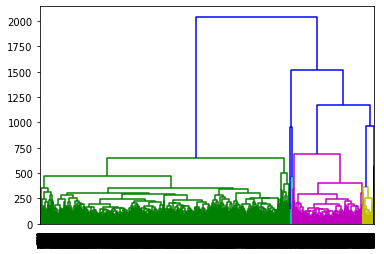

In [ ]:
#3. Hierarchical Clustering
# 3.1. Compute the similarity matrix
dist = sklearn.neighbors.DistanceMetric.get_metric('euclidean')
matsim = dist.pairwise(static_defenses3)

# 3.2. Building the Dendrogram	
from scipy import cluster
clusters = cluster.hierarchy.linkage(matsim, method = 'complete')
# http://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.cluster.hierarchy.dendrogram.html
cluster.hierarchy.dendrogram(clusters, color_threshold=750)
plt.show()

In [ ]:
cut = 750 # !!!! ad-hoc
labels = cluster.hierarchy.fcluster(clusters, cut , criterion = 'distance')
print ('Number of clusters %d' % (len(set(labels))))
labels

Number of clusters 6


array([1, 1, 1, ..., 1, 1, 1], dtype=int32)

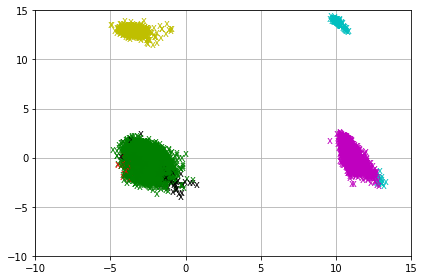

In [ ]:
colors = np.array([x for x in 'bgrcmykbgrcmykbgrcmykbgrcmyk'])
colors = np.hstack([colors] * 1064)


fig, ax = plt.subplots()
plt.xlim(-10, 15)
plt.ylim(-10, 15)

for i in range(len(X_pca)):
    plt.text(X_pca[i][0], X_pca[i][1], 'x', color=colors[labels[i]])  
    
ax.grid(True)
fig.tight_layout()
plt.show()